### Crash Stats - Data Extract - VicRoads CrashStats database

The data provided allows users to analyse Victorian fatal and injury crash data based on time, location, conditions, crash type, road user type, object hit etc.


Tables

- accident (basic accident details, time, severity, location)

- person (person based details, age, sex etc)

- vehicle (vehicle based data, vehicle type, make etc)

- accident_event (sequence of events e.g. left road, rollover, caught fire)

- road_surface_cond (whether road was wet, dry, icy etc)

- atmospheric_cond (rain, winds etc)

- sub_dca (detailed codes describing accident)

- accident_node (master location table - NB subset of accident table)

- Node Table with Lat/Long references

Further explanation about the fields can be found at the link below:

https://data.vicroads.vic.gov.au/Metadata/Crash%20Stats%20-%20Data%20Extract%20-%20Open%20Data.html

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import itertools

from pandas_profiling import ProfileReport
from sklearn.preprocessing import LabelBinarizer

from simple_colors import *
pd.set_option('display.max_columns', None) # Unlimited.

import warnings
warnings.filterwarnings("ignore")

import sys
import sklearn.neighbors._base 
sys.modules['sklearn.neighbors.base'] = sklearn.neighbors._base



import sqlite3

import json
import folium

RANDOM_STATE = 42

_Set a colour palette and theme that will apply all the plot unless different settings are specified._

In [2]:
PALETTE = 'ch:s=.35,rot=-.35'
sns.set_theme(
    font_scale=1,
    font='arial',
    palette=sns.set_palette(sns.color_palette(PALETTE, as_cmap=False)),
    rc={'figure.figsize':(20,10)},
    )

In [3]:
%load_ext watermark
%watermark --iversions
!python --version

sklearn   : 1.0.2
json      : 2.0.9
folium    : 0.12.1.post1
numpy     : 1.21.5
sqlite3   : 2.6.0
sys       : 3.9.12 (main, Apr  5 2022, 01:53:17) 
[Clang 12.0.0 ]
seaborn   : 0.11.2
matplotlib: 3.5.1
pandas    : 1.4.2

Python 3.9.12


In [4]:
#Load all the data provided

#1
data_ACCIDENT = pd.read_csv('../data/2000_to_2005_ACCIDENT/ACCIDENT.csv')
#2
data_ACCIDENT_CHAINAGE = pd.read_csv('../data/2000_to_2005_ACCIDENT/ACCIDENT_CHAINAGE.csv')
#3
data_ACCIDENT_EVENT = pd.read_csv('../data/2000_to_2005_ACCIDENT/ACCIDENT_EVENT.csv')
#4
data_ACCIDENT_LOCATION = pd.read_csv('../data/2000_to_2005_ACCIDENT/ACCIDENT_LOCATION.csv')
#5
data_ATMOSPHERIC_COND = pd.read_csv('../data/2000_to_2005_ACCIDENT/ATMOSPHERIC_COND.csv')
#6
data_NODE = pd.read_csv('../data/2000_to_2005_ACCIDENT/NODE.csv')
#7
data_NODE_ID_COMPLEX_INT_ID = pd.read_csv('../data/2000_to_2005_ACCIDENT/NODE_ID_COMPLEX_INT_ID.csv')
#8
data_PERSON = pd.read_csv('../data/2000_to_2005_ACCIDENT/PERSON.csv')
#9
data_ROAD_SURFACE_COND = pd.read_csv('../data/2000_to_2005_ACCIDENT/ROAD_SURFACE_COND.csv')
#10
data_SUBDCA = pd.read_csv('../data/2000_to_2005_ACCIDENT/SUBDCA.csv')
#11
data_Statistic_Checks = pd.read_csv('../data/2000_to_2005_ACCIDENT/Statistic_Checks.csv')
#12
data_VEHICLE = pd.read_csv('../data/2000_to_2005_ACCIDENT/VEHICLE.csv')


In [5]:
#Create a dictionary with the data frames names and data frames 

data_frames = {'ACCIDENT'                    : data_ACCIDENT, 
               'ACCIDENT_CHAINAGE'           : data_ACCIDENT_CHAINAGE, 
               'ACCIDENT_EVENT'              : data_ACCIDENT_EVENT, 
               'ACCIDENT_LOCATION'           : data_ACCIDENT_LOCATION,
               'ATMOSPHERIC_COND'            : data_ATMOSPHERIC_COND,
               'NODE'                        : data_NODE,
               'NODE_ID_COMPLEX_INT_ID'      : data_NODE_ID_COMPLEX_INT_ID,
               'PERSON'                      : data_PERSON,
               'ROAD_SURFACE_COND'           : data_ROAD_SURFACE_COND,
               'SUBDCA'                      : data_SUBDCA,
               'Statistic_Checks'            : data_Statistic_Checks,
               'VEHICLE'                     : data_VEHICLE}

_Display all the tables heads_

In [9]:
n = 2
for key, value in data_frames.items():
    
    print(blue(f'\n The {key} data frame is:', 'underlined'))

    display(value.head(n))


 The ACCIDENT data frame is:


,ACCIDENT_NO,ACCIDENTDATE,ACCIDENTTIME,ACCIDENT_TYPE,Accident Type Desc,DAY_OF_WEEK,Day Week Description,DCA_CODE,DCA Description,DIRECTORY,EDITION,PAGE,GRID_REFERENCE_X,GRID_REFERENCE_Y,LIGHT_CONDITION,Light Condition Desc,NODE_ID,NO_OF_VEHICLES,NO_PERSONS,NO_PERSONS_INJ_2,NO_PERSONS_INJ_3,NO_PERSONS_KILLED,NO_PERSONS_NOT_INJ,POLICE_ATTEND,ROAD_GEOMETRY,Road Geometry Desc,SEVERITY,SPEED_ZONE
0,12000000389,4/01/2000,22.30.00,4,Collision with a fixed object,3,Tuesday,171,LEFT OFF CARRIAGEWAY INTO OBJECT/PARKED VEHICL...,MEL,40.0,88,H,11.0,5,Dark No street lights,25264,1,2,1,0,1,0,1,5,Not at intersection,1,90
1,12000000554,6/01/2000,22.15.00,4,Collision with a fixed object,5,Thursday,171,LEFT OFF CARRIAGEWAY INTO OBJECT/PARKED VEHICL...,MEL,40.0,87,C,1.0,3,Dark Street lights on,42800,1,1,1,0,0,0,1,2,T intersection,2,60



 The ACCIDENT_CHAINAGE data frame is:


,Node Id,Route No,Chainage Seq,Route Link No,Chainage
0,2,169750,1,169750801,0
1,2,178123,2,178123801,5415



 The ACCIDENT_EVENT data frame is:


,ACCIDENT_NO,EVENT_SEQ_NO,EVENT_TYPE,Event Type Desc,VEHICLE_1_ID,VEHICLE_1_COLL_PT,Vehicle 1 Coll Pt Desc,VEHICLE_2_ID,VEHICLE_2_COLL_PT,Vehicle 2 Coll Pt Desc,PERSON_ID,OBJECT_TYPE,Object Type Desc
0,12000000389,1.0,3,Ran off carriageway,A,9,Not known or Not Applicable,,,,,99.0,Not Applicable
1,12000000389,2.0,C,Collision,A,F,Front,,,,,1.0,Pole (telphone/electricity)



 The ACCIDENT_LOCATION data frame is:


,ACCIDENT_NO,NODE_ID,ROAD_ROUTE_1,ROAD_NAME,ROAD_TYPE,ROAD_NAME_INT,ROAD_TYPE_INT,DISTANCE_LOCATION,DIRECTION_LOCATION,NEAREST_KM_POST,OFF_ROAD_LOCATION
0,12000000389,25264,2400.0,SPRINGVALE,ROAD,KEYLANA,DRIVE,113.0,N,NaN,NaN
1,12000000554,42800,2070.0,WARRIGAL,ROAD,IRENE,COURT,0.0,S,NaN,NaN



 The ATMOSPHERIC_COND data frame is:


,ACCIDENT_NO,ATMOSPH_COND,ATMOSPH_COND_SEQ,Atmosph Cond Desc
0,12000000389,7,1,Strong winds
1,12000000554,1,1,Clear



 The NODE data frame is:


,ACCIDENT_NO,NODE_ID,NODE_TYPE,AMG_X,AMG_Y,LGA_NAME,Region Name,Deg Urban Name,Lat,Long,Postcode No
0,12000000389,25264,N,2512514.427,2388780.839,DANDENONG,METROPOLITAN SOUTH EAST REGION,Metropolitan Excluding CBD,-38.00211,145.14248,3173
1,12000000554,42800,I,2506548.994,2392856.260,KINGSTON,METROPOLITAN SOUTH EAST REGION,Metropolitan Excluding CBD,-37.96545,145.07453,3192



 The NODE_ID_COMPLEX_INT_ID data frame is:


,ACCIDENT_NO,NODE_ID,COMPLEX_INT_NO
0,12000000586,57539,5760
1,12000001526,45858,100369



 The PERSON data frame is:


,ACCIDENT_NO,PERSON_ID,VEHICLE_ID,SEX,AGE,Age Group,INJ_LEVEL,Inj Level Desc,SEATING_POSITION,HELMET_BELT_WORN,ROAD_USER_TYPE,Road User Type Desc,LICENCE_STATE,PEDEST_MOVEMENT,POSTCODE,TAKEN_HOSPITAL,EJECTED_CODE
0,12000000389,01,A,M,16.0,16-17,2,Serious injury,LF,1,3,Passengers,,0,NaN,Y,0
1,12000000389,A,A,M,19.0,17-21,1,Fatality,D,9,2,Drivers,V,0,3169.0,,0



 The ROAD_SURFACE_COND data frame is:


,ACCIDENT_NO,SURFACE_COND,Surface Cond Desc,SURFACE_COND_SEQ
0,12000000389,9,Unknown,1
1,12000000554,1,Dry,1



 The SUBDCA data frame is:


,ACCIDENT_NO,SUB_DCA_CODE,SUB_DCA_SEQ,Sub Dca Code Desc
0,12000000389,Q01,2,Poles (telephone/electricity)
1,12000000389,Q10,3,Other objects (Telephone/Culvert/RX) Fixed/Not...



 The Statistic_Checks data frame is:


,,,,No. of Crashes By Severity By Year as at,16/12/16
NaN,1,2,3,4,Sum:
"2,000",373,"5,156","12,395",NaN,"17,924"



 The VEHICLE data frame is:


,ACCIDENT_NO,VEHICLE_ID,VEHICLE_YEAR_MANUF,VEHICLE_DCA_CODE,INITIAL_DIRECTION,ROAD_SURFACE_TYPE,Road Surface Type Desc,REG_STATE,VEHICLE_BODY_STYLE,VEHICLE_MAKE,VEHICLE_MODEL,VEHICLE_POWER,VEHICLE_TYPE,Vehicle Type Desc,VEHICLE_WEIGHT,CONSTRUCTION_TYPE,FUEL_TYPE,NO_OF_WHEELS,NO_OF_CYLINDERS,SEATING_CAPACITY,TARE_WEIGHT,TOTAL_NO_OCCUPANTS,CARRY_CAPACITY,CUBIC_CAPACITY,FINAL_DIRECTION,DRIVER_INTENT,VEHICLE_MOVEMENT,TRAILER_TYPE,VEHICLE_COLOUR_1,VEHICLE_COLOUR_2,CAUGHT_FIRE,INITIAL_IMPACT,LAMPS,LEVEL_OF_DAMAGE,OWNER_POSTCODE,TOWED_AWAY_FLAG,TRAFFIC_CONTROL,Traffic Control Desc
0,12000000389,A,1979.0,1,N,1,Paved,V,SEDAN,HOLDEN,,31.0,1,Car,NaN,R,P,4.0,6.0,5.0,1250.0,2,1250.0,NaN,N,1,18,H,WHI,ZZ,1,F,1,5,3169.0,1,0,No control
1,12000000554,A,1987.0,1,E,1,Paved,V,SEDAN,FORD,,32.0,1,Car,NaN,R,P,4.0,NaN,5.0,1300.0,1,1300.0,NaN,N,3,01,H,MRN,ZZ,2,F,1,4,3192.0,1,0,No control


__________

### Exploratory Data Analysis

### Data Cleaning

__Column names__

Clean the column names:
- replace space with underscore
- lowercase

In [7]:
for df_name, df in data_frames.items():
    df.columns = df.columns.str.replace(' ','_')
    df.columns= df.columns.str.lower()   

__Check the Duplicated Values__

In [8]:
duplicated_total = []
for df_name, df in data_frames.items():
    duplicates = df.duplicated().sum()
    duplicated_total.append(duplicates)
duplicated_total

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 30, 0]

In [9]:
data_Statistic_Checks.duplicated().sum()

30

__Data and Time columns__

In [10]:
data_ACCIDENT["accidenttime"].dtype

dtype('O')

In [11]:
data_ACCIDENT["accidentdate"].dtype

dtype('O')

In [12]:
data_ACCIDENT["accidentdate"] = pd.to_datetime(data_ACCIDENT["accidentdate"])

In [13]:
data_ACCIDENT["accidentdate"].head(2)

0   2000-04-01
1   2000-06-01
Name: accidentdate, dtype: datetime64[ns]

__Missing Values__

Let's check all the tables and see the missing values.

The ACCIDENT table's missing value plot is: 



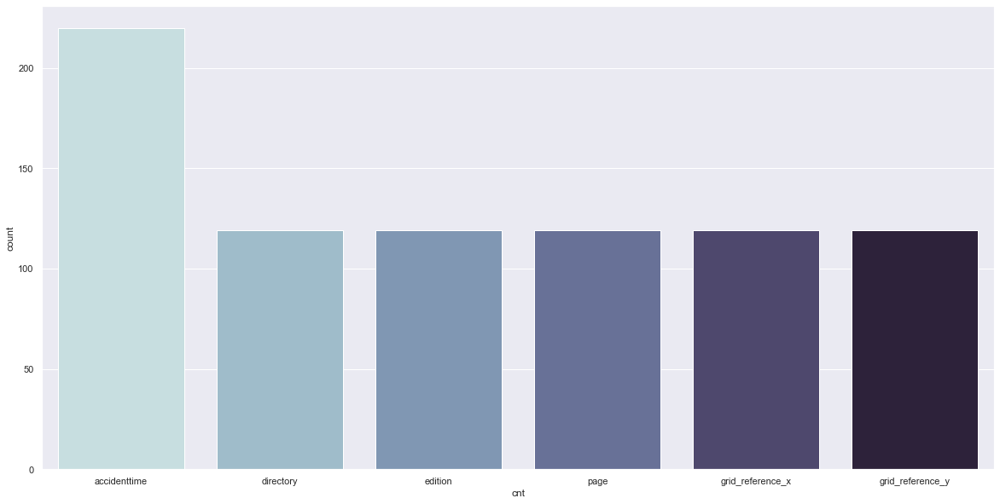

ACCIDENT_CHAINAGE table doesn't have any missing value

The ACCIDENT_EVENT table's missing value plot is: 



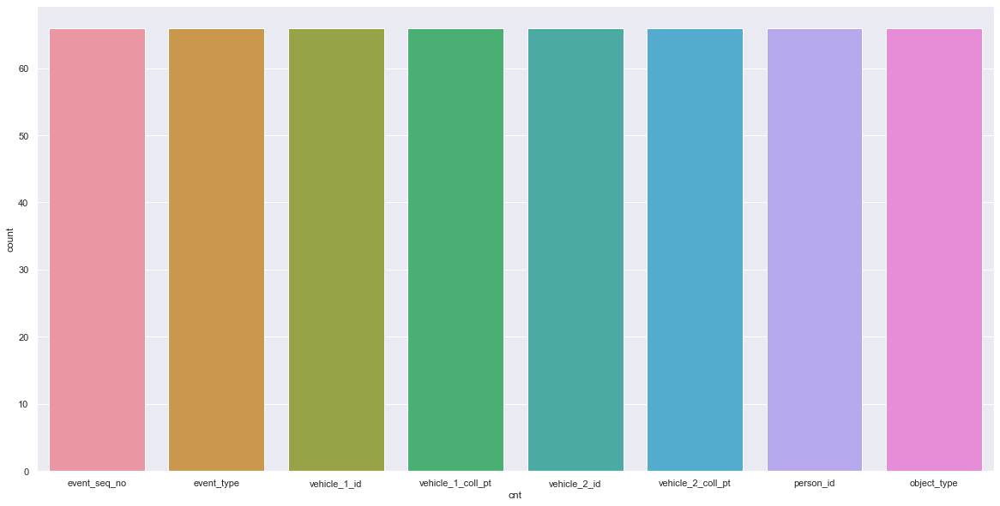

The ACCIDENT_LOCATION table's missing value plot is: 



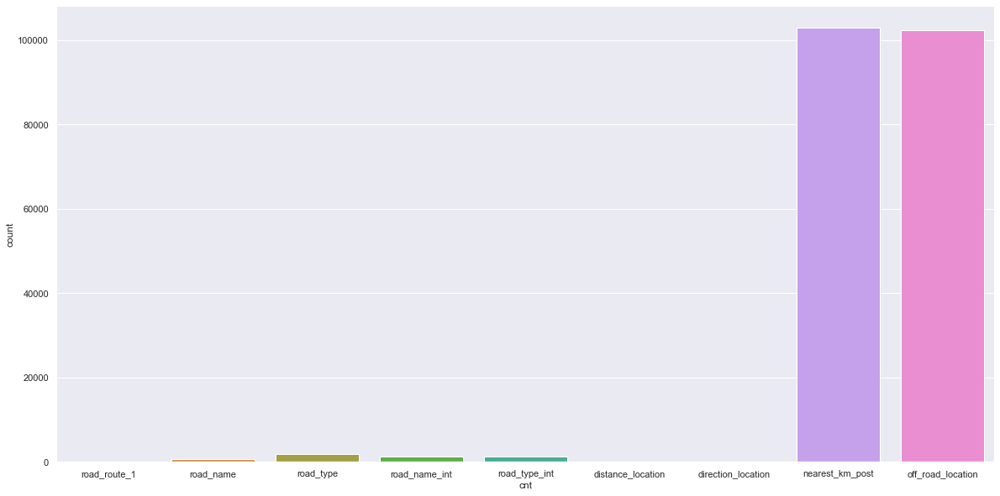

ATMOSPHERIC_COND table doesn't have any missing value

NODE table doesn't have any missing value

NODE_ID_COMPLEX_INT_ID table doesn't have any missing value

The PERSON table's missing value plot is: 



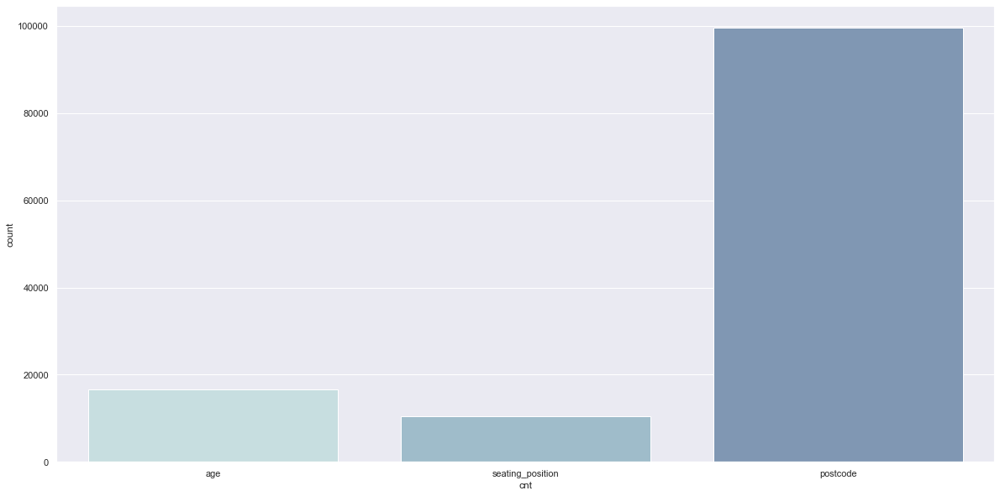

ROAD_SURFACE_COND table doesn't have any missing value

SUBDCA table doesn't have any missing value

The Statistic_Checks table's missing value plot is: 



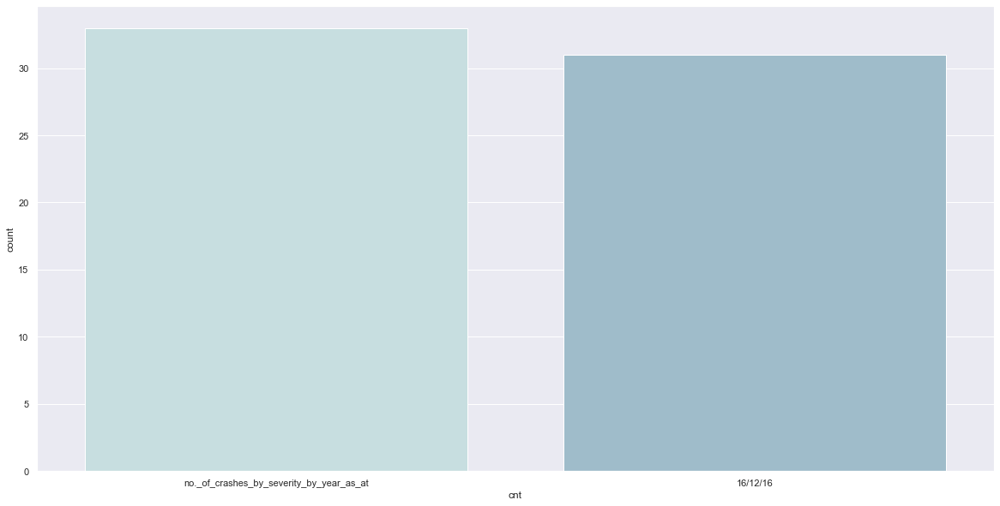

The VEHICLE table's missing value plot is: 



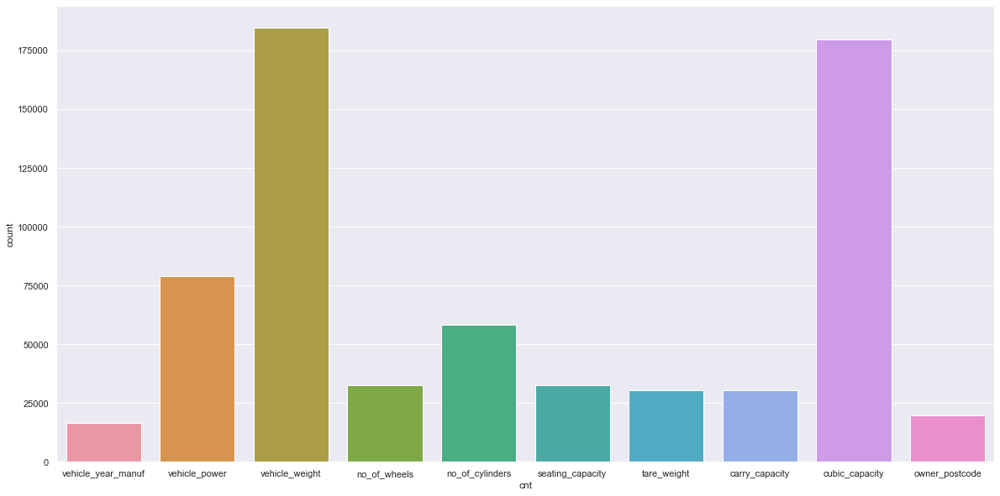

In [14]:
for df_name, df in data_frames.items():
    #if df[df.isnull().sum() > 0]:
    if(df.isnull().sum() > 0).any():
        data = pd.DataFrame({'cnt': list(itertools.chain(*[[row['index']] * row['cnt'] for idx, row in df.isnull().sum().to_frame('cnt').reset_index().iterrows()]))})
        sns.countplot(x = 'cnt', data = data)
        print(blue(f'The {df_name} table\'s missing value plot is: \n'))
        plt.show()
    else:
        print(green(f'{df_name} table doesn\'t have any missing value\n'))

_We can also see the missing values by using heatmap of Null values. This might provide better understanding of data and helps to decide the best way of imputation method._

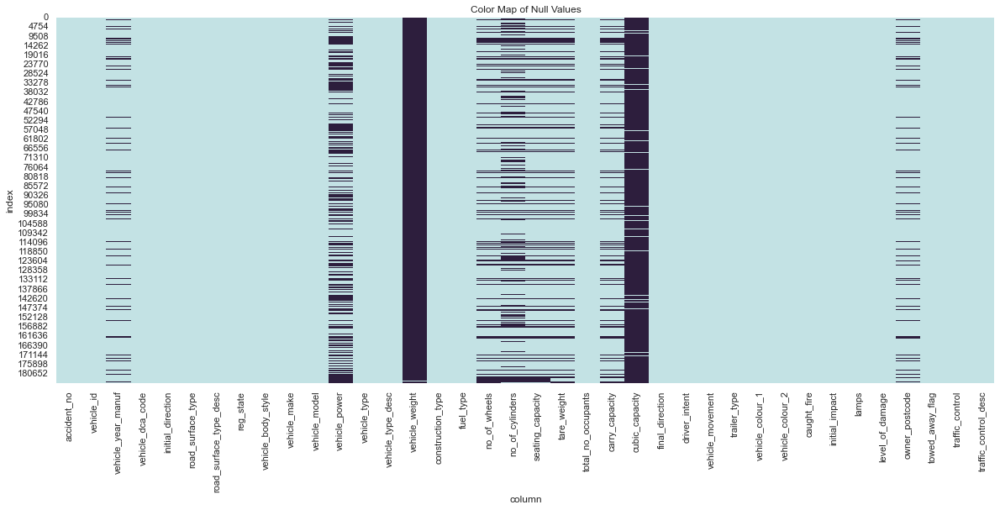

In [15]:
plt.figure(figsize=(20,8))
sns.heatmap(data_VEHICLE.isnull(), cbar=False, cmap=sns.color_palette(PALETTE, as_cmap=True))
plt.ylabel('index')
plt.xlabel('column')
plt.title('Color Map of Null Values')
plt.show()

For vehicle table, we can see that in general, data of cars' wheels, cylinder or carry capasity are missing in the same indexes. 

### Note:

There are 12 tables with different columns. For the data visualization, we will select the columns we want to zoom in and see the patterns and relationships. 

Using SQL can be more effective with less coding for selectign columns from different tables with filters if needed.  By creating a database, we can simply ingest the tables and query from there. 

In [16]:
# connect/create a database called test.db
conn = sqlite3.connect("../data_base/test.db") 

# store all of the tables in the test.db database:

#for key, value in data_frames.items():
#    value.to_sql(key, conn)

__Let's check if all the tables are ingested into the database!__

In [17]:
cursor = conn.cursor()

cursor.execute("SELECT name FROM sqlite_master WHERE type='table';")
print(cursor.fetchall())

[('ACCIDENT',), ('ACCIDENT_CHAINAGE',), ('ACCIDENT_EVENT',), ('ACCIDENT_LOCATION',), ('ATMOSPHERIC_COND',), ('NODE',), ('NODE_ID_COMPLEX_INT_ID',), ('PERSON',), ('ROAD_SURFACE_COND',), ('SUBDCA',), ('Statistic_Checks',), ('VEHICLE',)]


Since we have the coordinates data, it can give a useful insight to see all the accidents on the map of Australia.

By this way we can see the extend of data by the region

In [10]:
sql_string = '''
                SELECT count(accident_no) as total_crash, lat, long, postcode_no
                FROM 
                    NODE
                GROUP BY postcode_no
                                         
             '''
df_coordinates = pd.read_sql(sql_string, conn)

NameError: name 'conn' is not defined

In [11]:
m = folium.Map([-38.043995, 145.264296], zoom_start=7)

for index, row in df_coordinates.iterrows():
    if row['total_crash'] >= 2000:
        marker_color = 'darkred'
        fill_color = 'lightred'
    elif row['total_crash'] >= 1500:
        marker_color = 'darkred'
        fill_color = 'orange'
    elif row['total_crash'] >= 1000:
        marker_color = 'darkred'
        fill_color = 'lightorange'
    elif row['total_crash'] >= 500:
        marker_color = 'darkred'
        fill_color = 'lightred'
    else:
        marker_color='darkred'
        fill_color = 'lightyellow'
        
    folium.Circle(
          location=[row['lat'], row['long']],
          popup= 'Accidents:' +str(row['total_crash']),
          radius=row['total_crash'],
          color=marker_color,
          fill=False,
          fill_color=fill_color,
       ).add_to(m)

NameError: name 'df_coordinates' is not defined

In [20]:
m

From the map we see that the number of the accidents increase around the city centers. 

Melburn has the highest ratio as it was expected. 

If we zoom in more, we can spot the exact streets and neighboors where more accidents are happening. 

We can also map the filtered data based on hours and accident type to see what kind of accidents are happening in different spots. 

### Data Statistics

_For a start, let's select some of the column to look at their basic statistics and print the pandas profiling report for more advanced statistical report_

In [21]:
sql_select_columns = '''

                SELECT 
                --from ACCIDENT table
                    accidentdate,
                    accidenttime,
                    accident_type,
                    accident_type_desc,
                    day_of_week,
                    day_week_description,
                    light_condition,
                    no_persons,
                    no_persons_killed,
                    road_geometry,
                    road_geometry_desc,
                    severity,
                    speed_zone,
                    
                --from ACCIDENT_EVENT table
                    event_type,
                    event_type_desc,
                    object_type,
                    object_type_desc,
                    
                    
                --from ATMOSPHERIC_COND table
                    atmosph_cond,
                    atmosph_cond_desc,
                    
                    
                --from PERSON table
                    sex,
                    age_group,
                    seating_position,
                    helmet_belt_worn,
                    road_user_type,
                    road_user_type_desc,
                    
                --from ROAD_SURFACE_COND table
                    surface_cond,
                    surface_cond_desc,
                    
                --from VEHICLE table
                    vehicle_year_manuf,
                    road_surface_type,
                    road_surface_type_desc,
                    vehicle_type,
                    vehicle_type_desc
                    
                FROM 
                    ACCIDENT as a
                JOIN 
                    ACCIDENT_EVENT as ae      ON a.accident_no = ae.accident_no
                JOIN
                    ATMOSPHERIC_COND as ac    ON a.accident_no = ac.accident_no
                JOIN
                    PERSON as p               ON a.accident_no = p.accident_no
                JOIN
                    ROAD_SURFACE_COND as rsc  ON a.accident_no = rsc.accident_no
                JOIN 
                    VEHICLE as v              ON a.accident_no = v.accident_no
                    
    
            
             '''
df_coordinates = pd.read_sql(sql_select_columns, conn)

In [22]:
df_selected_columns = pd.read_sql(sql_select_columns, conn)

In [23]:
df_selected_columns.head()

,accidentdate,accidenttime,accident_type,accident_type_desc,day_of_week,day_week_description,light_condition,no_persons,no_persons_killed,road_geometry,road_geometry_desc,severity,speed_zone,event_type,event_type_desc,object_type,object_type_desc,atmosph_cond,atmosph_cond_desc,sex,age_group,seating_position,helmet_belt_worn,road_user_type,road_user_type_desc,surface_cond,surface_cond_desc,vehicle_year_manuf,road_surface_type,road_surface_type_desc,vehicle_type,vehicle_type_desc
0,2005-07-14 00:00:00,09.30.00,4,Collision with a fixed object,5,Thursday,1,3,0,5,Not at intersection,2,50,3,Ran off carriageway,99.0,Not Applicable,1,Clear,F,40-49,D,1,2,Drivers,2,Wet,2003.0,1,Paved,1,Car
1,2005-07-14 00:00:00,09.30.00,4,Collision with a fixed object,5,Thursday,1,3,0,5,Not at intersection,2,50,3,Ran off carriageway,99.0,Not Applicable,1,Clear,F,40-49,D,1,2,Drivers,2,Wet,2005.0,1,Paved,1,Car
2,2005-07-14 00:00:00,09.30.00,4,Collision with a fixed object,5,Thursday,1,3,0,5,Not at intersection,2,50,C,Collision,1.0,Pole (telphone/electricity),1,Clear,F,40-49,D,1,2,Drivers,2,Wet,2003.0,1,Paved,1,Car
3,2005-07-14 00:00:00,09.30.00,4,Collision with a fixed object,5,Thursday,1,3,0,5,Not at intersection,2,50,C,Collision,1.0,Pole (telphone/electricity),1,Clear,F,40-49,D,1,2,Drivers,2,Wet,2005.0,1,Paved,1,Car
4,2005-07-14 00:00:00,09.30.00,4,Collision with a fixed object,5,Thursday,1,3,0,5,Not at intersection,2,50,C,Collision,99.0,Not Applicable,1,Clear,F,40-49,D,1,2,Drivers,2,Wet,2003.0,1,Paved,1,Car


__Basic statistics__

In [24]:
df_selected_columns.describe()

,accident_type,day_of_week,light_condition,no_persons,no_persons_killed,road_geometry,severity,speed_zone,object_type,atmosph_cond,helmet_belt_worn,road_user_type,surface_cond,vehicle_year_manuf,road_surface_type,vehicle_type
count,25003.000000,25003.000000,25003.000000,25003.000000,25003.000000,25003.000000,25003.000000,25003.000000,25003.000000,25003.000000,25003.000000,25003.000000,25003.000000,23368.000000,25003.000000,25003.000000
mean,1.516938,4.299204,1.514258,4.762508,0.023157,3.426709,2.609447,79.566292,91.988961,1.387993,2.596568,2.567412,1.323521,1993.896868,1.175379,4.195537
std,1.330264,1.977117,1.146491,4.389448,0.189897,1.803751,0.526448,88.482317,24.760527,1.432466,3.032565,1.144421,1.173632,55.906884,1.025395,12.429919
min,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,40.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000
25%,1.000000,3.000000,1.000000,3.000000,0.000000,2.000000,2.000000,60.000000,99.000000,1.000000,1.000000,2.000000,1.000000,1990.000000,1.000000,1.000000
50%,1.000000,5.000000,1.000000,4.000000,0.000000,5.000000,3.000000,70.000000,99.000000,1.000000,1.000000,2.000000,1.000000,1997.000000,1.000000,1.000000
75%,1.000000,6.000000,1.000000,6.000000,0.000000,5.000000,3.000000,80.000000,99.000000,1.000000,1.000000,3.000000,1.000000,2001.000000,1.000000,2.000000
max,9.000000,7.000000,9.000000,50.000000,3.000000,9.000000,4.000000,999.000000,99.000000,9.000000,9.000000,9.000000,9.000000,2005.000000,9.000000,99.000000


In [25]:
df_selected_columns.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25003 entries, 0 to 25002
Data columns (total 32 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   accidentdate            25003 non-null  object 
 1   accidenttime            24997 non-null  object 
 2   accident_type           25003 non-null  int64  
 3   accident_type_desc      25003 non-null  object 
 4   day_of_week             25003 non-null  int64  
 5   day_week_description    25003 non-null  object 
 6   light_condition         25003 non-null  int64  
 7   no_persons              25003 non-null  int64  
 8   no_persons_killed       25003 non-null  int64  
 9   road_geometry           25003 non-null  int64  
 10  road_geometry_desc      25003 non-null  object 
 11  severity                25003 non-null  int64  
 12  speed_zone              25003 non-null  int64  
 13  event_type              25003 non-null  object 
 14  event_type_desc         25003 non-null

__Profile Report__

In [26]:
profile_selected_columns = ProfileReport(df_selected_columns, minimal=False, explorative=True)
profile_selected_columns.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

----------

_Let's look at some of the columns closer in boxplot and histogram at the same line_

In [27]:
 def compare_boxplot_hist(df: pd.DataFrame, col: str, xlim_min: int, xlim_max: int, binwidth: int ) -> None:
        
        '''Generates a boxplot and histogram plot of the values in the ``col`` column of the ``df`` dataframe.
        
             Args:
                 df (pd.DataFrame): dataframe to be plotted.
                 col(str): column.
                 xlim_min, xlim_max: the limit of x values to be drawn.
                 binwidth : binwidth parameter for seaborn histogram plot.
                 
        '''
        _, axs = plt.subplots(1, 2,)
        sns.boxplot(x=df[col], ax=axs[0], showmeans=True, showfliers = False)
        axs[0].set_title('Boxplot')
        sns.histplot(df[col], ax=axs[1], kde=False, binwidth=binwidth)
        plt.xlim(xlim_min,xlim_max)
        axs[1].set_title('Histogram')
        plt.suptitle(f'Distribusion of {col}')
        plt.tight_layout()
        plt.show()

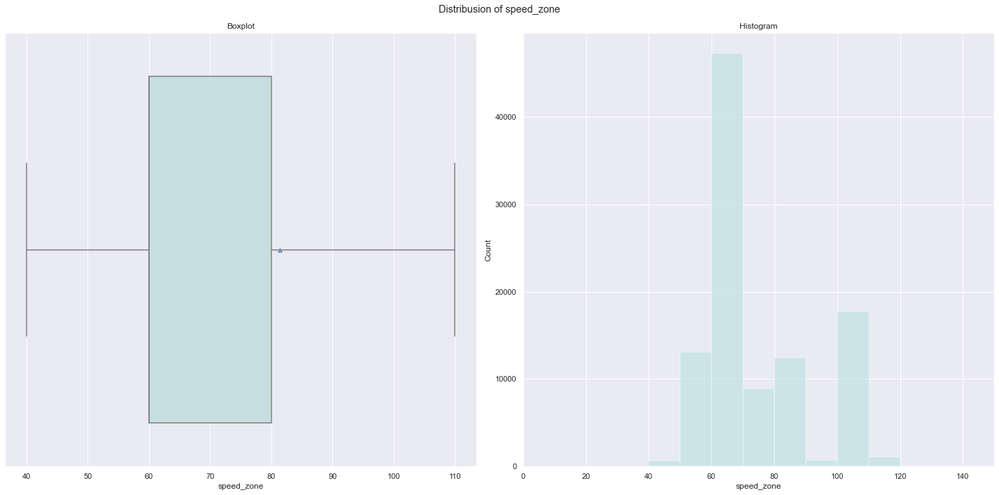

In [28]:
compare_boxplot_hist(data_ACCIDENT, 'speed_zone', 0,150, 10) #df, col, xlim_min, xlim_max, binwidth

__We see that most of the accidents are happening in the road that have speed limit between 60 to 70__

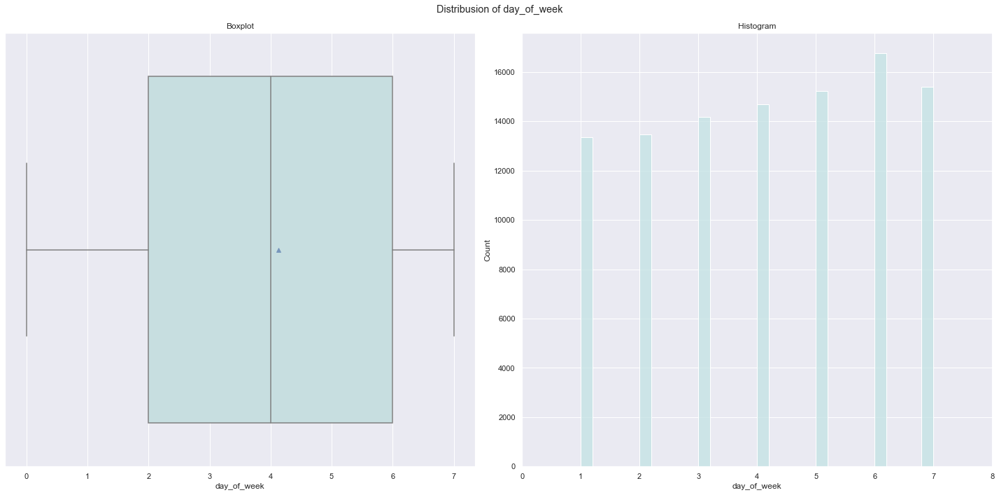

In [29]:
compare_boxplot_hist(data_ACCIDENT, 'day_of_week', 0,8,0.2)  #df, col, xlim_min, xlim_max, binwidth

__The highest number of accident are happened on Friday as day 6 is refered to it.__

From the dataset profile, we can also see the highest frequency is around time 16:00 and 15:30 with %2.6 - %2 followed by 16:30 -18:00 with %1.8 and %1.6.

That might be rush hour but for more details we should see the other conditions like weather or road situation that might have effect on accidents. 

For this we can select a sample data including only these hours and zoom in to see how the other variables change. 

In [30]:
ACCIDENT_15_30 = data_ACCIDENT[data_ACCIDENT.accidenttime == '15.30.00']
ACCIDENT_15_30.shape

(1434, 28)

- Let's look at the __'Accident Type Desc'__ field

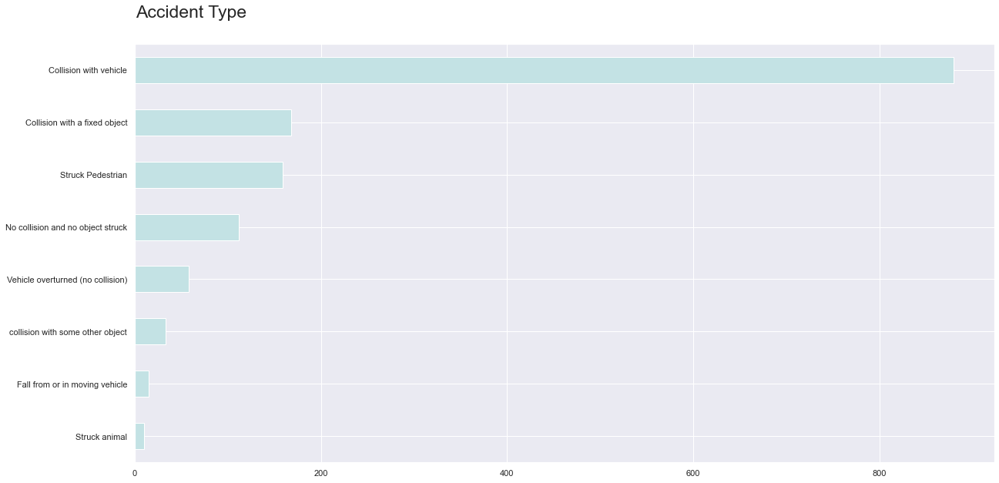

In [31]:
ACCIDENT_15_30['accident_type_desc'].value_counts().sort_values().plot(kind = 'barh')
  
plt.text(1, 8, 'Accident Type', fontsize = 23)
  

plt.show()

_Wee see that Collision of the Vehicles is a big problem especially in the rush hours!_

If we look at the detailed explanation of the accidents from DCA Chard Description:

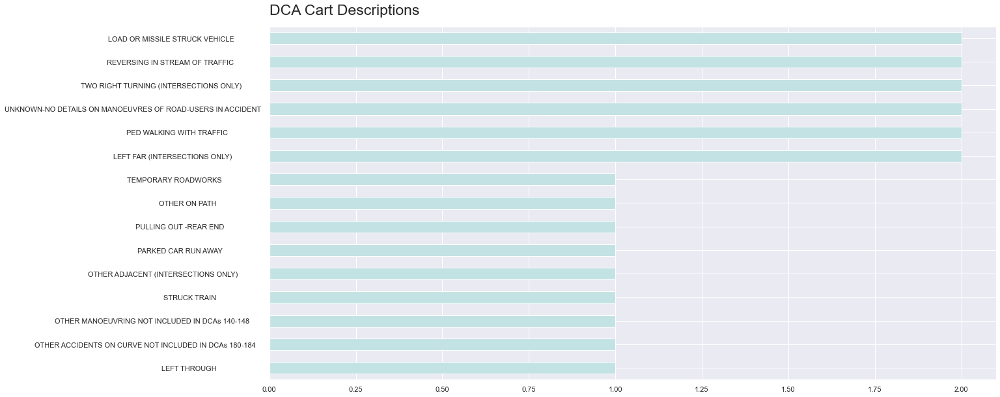

In [32]:
ACCIDENT_15_30['dca_description'].value_counts().sort_values().iloc[:15].plot(kind = 'barh')
plt.text(0, 15, 'DCA Cart Descriptions', fontsize = 23)

plt.show()

We see the accidents in the intersections like,

- Two right turning
- Left Far 

have some of the highest apperance in the data. 

If we look at the road geometry we will see similar results from there as well.

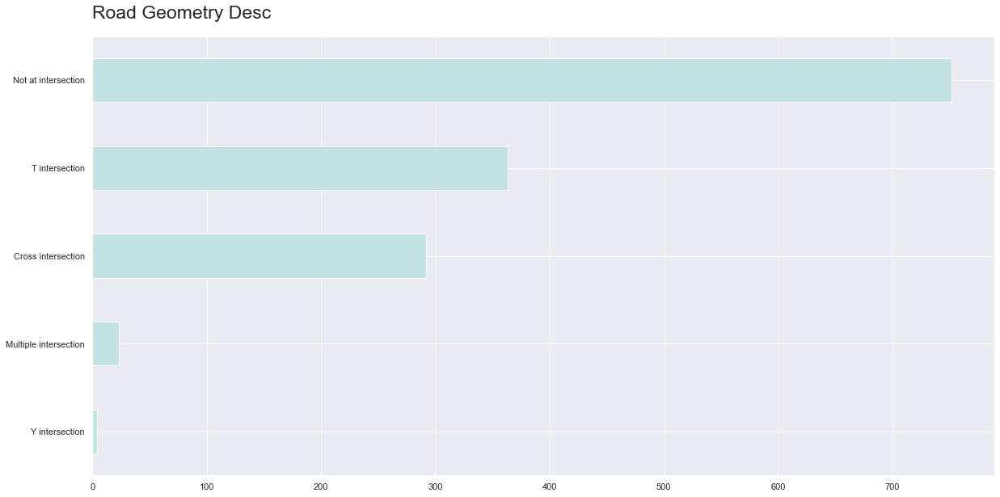

In [33]:
ACCIDENT_15_30['road_geometry_desc'].value_counts().sort_values().plot(kind = 'barh')
plt.text(0, 4.7, 'Road Geometry Desc', fontsize = 23)


plt.show()

### Note:

We see that compared to the Y-intersection roads,

T-intersection roads are more likely to have accidents.

It can be a solution to do a conversion of the T-intersection to the Y-intersection.


-----------

In [34]:
PALETTE_colorful = sns.color_palette("Set2")

sns.set_theme(
    palette=sns.set_palette(sns.color_palette(PALETTE, as_cmap=False)),
    rc={'figure.figsize':(10,8)},
    )

__________

__Annual fatalities between 2000-2005__

In [35]:
annual_fatalities = '''
                SELECT 
                    SUM(no_persons_killed) as total_persons_killed,
                    strftime('%Y', accidentdate) as year
                FROM 
                    ACCIDENT
                GROUP BY 
                    year
                                         
             '''
df_annual_fatalities = pd.read_sql(annual_fatalities, conn)

In [36]:
df_annual_fatalities.head(2)

,total_persons_killed,year
0,407,2000
1,444,2001


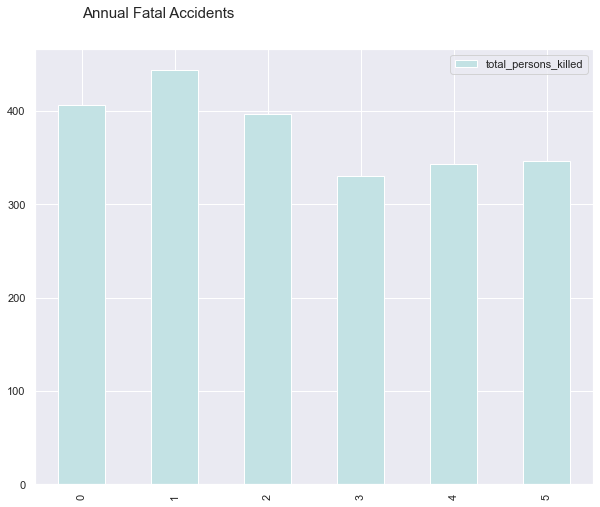

In [37]:
df_annual_fatalities.plot(kind = 'bar')
plt.text(0, 500, 'Annual Fatal Accidents', fontsize = 15)
plt.show()

__Annual hospitalised injuries and hospitalised injuries__

In [38]:
annual_hospitalised = '''
                SELECT 
                    taken_hospital, 
                    strftime('%Y', accidentdate) as year
                FROM 
                    PERSON as p
                JOIN
                    ACCIDENT as a ON p.accident_no = a.accident_no
                '''
df_annual_hospitalised = pd.read_sql(annual_hospitalised, conn)

In [39]:
df_annual_hospitalised.taken_hospital = df_annual_hospitalised.taken_hospital.map(dict(Y=1, N=0))
df_annual_hospitalised = df_annual_hospitalised.groupby(['year']).sum()

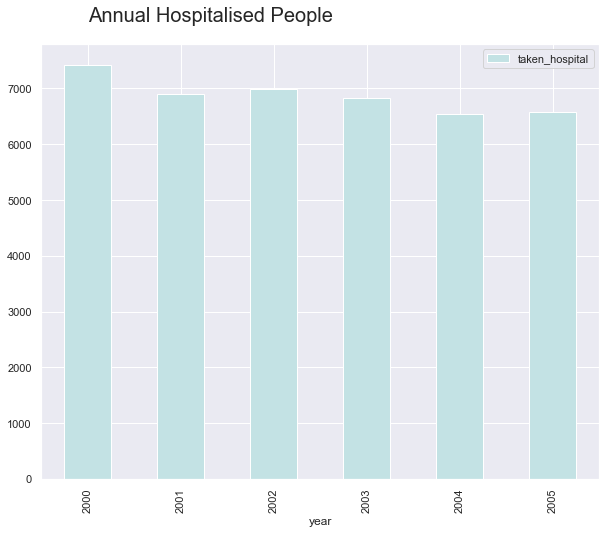

In [40]:
df_annual_hospitalised.plot(kind = 'bar')
plt.text(0, 8200, 'Annual Hospitalised People', fontsize = 20)
plt.show()

- _Annual number of hospitalised people trending downwards_

__Deaths by road user group__

In [41]:
annual_fatal_UG = '''
                SELECT 
                    vehicle_type, 
                    vehicle_type_desc, 
                    a.no_persons_killed,
                    strftime('%Y', accidentdate) as year
                FROM 
                    VEHICLE as v
                JOIN
                    ACCIDENT as a ON v.accident_no = a.accident_no
                WHERE 
                    vehicle_type_desc in ('Car', 'Station Wagon', 'Motor Cycle','Bicycle', 'Panel Van', 'Taxi')
                AND
                    no_persons_killed > 0
                '''
df_annual_death_UG = pd.read_sql(annual_fatal_UG, conn)

In [42]:
def group_categories_annual(data: pd.DataFrame, col: str)  -> None:
    df = data.copy()
    # creating an object of the LabelBinarizer
    label_binarizer = LabelBinarizer()
    label_binarizer_output = label_binarizer.fit_transform( df[col])
    
    # creating a data frame from the object
    binarized_df = pd.DataFrame(label_binarizer_output,
                         columns = label_binarizer.classes_)
    
    binarized_and_year_df = pd.concat([binarized_df, df['year']], axis=1)
    
    # applying groupby function
    annual_grouped_df = binarized_and_year_df.groupby(pd.Grouper(key='year')).sum()
    
    return annual_grouped_df
        

In [43]:
# run the function to create the data frame to be plotted
df_annual_death_user_group = group_categories_annual(df_annual_death_UG, 'vehicle_type_desc')

In [48]:
PALETTE_colorful = sns.color_palette("Set2")

sns.set_theme(
    palette=sns.set_palette(sns.color_palette(PALETTE_colorful, as_cmap=False)),
    rc={'figure.figsize':(16,7)},
    )

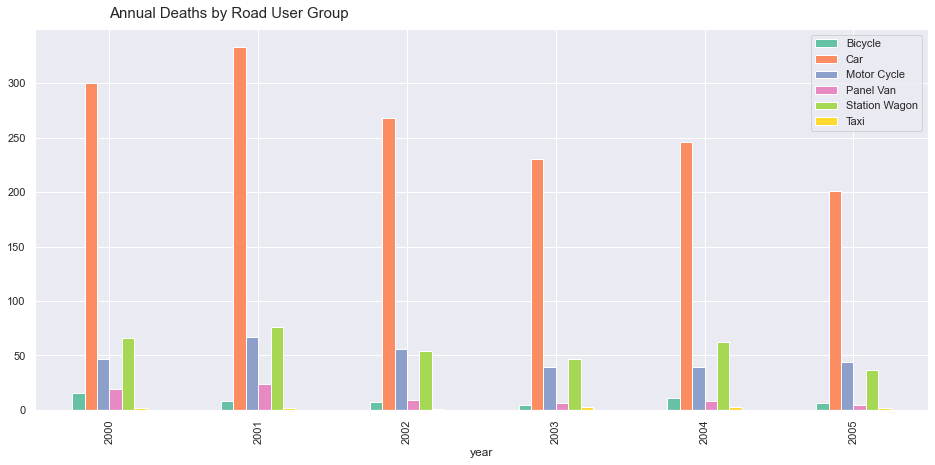

In [49]:
df_annual_death_user_group.plot(kind = 'bar')
plt.text(0, 360, 'Annual Deaths by Road User Group', fontsize = 15)
plt.show()

- We see that in 2000 and 2004, there are more bycicle accidents resulted with death

- Motor Cycles and Station Wagon have the second highes number of fatal accidents after cars.

__Deaths by age group__

In [50]:
annual_deaths_by_Age_Group = '''
                SELECT 
                    age_group, 
                    a.no_persons_killed,
                    strftime('%Y', accidentdate) as year
                FROM 
                    PERSON as p
                JOIN
                    ACCIDENT as a ON p.accident_no = a.accident_no
                WHERE 
                    no_persons_killed > 0
                '''
df_annual_deaths_by_age_group = pd.read_sql(annual_deaths_by_Age_Group, conn)

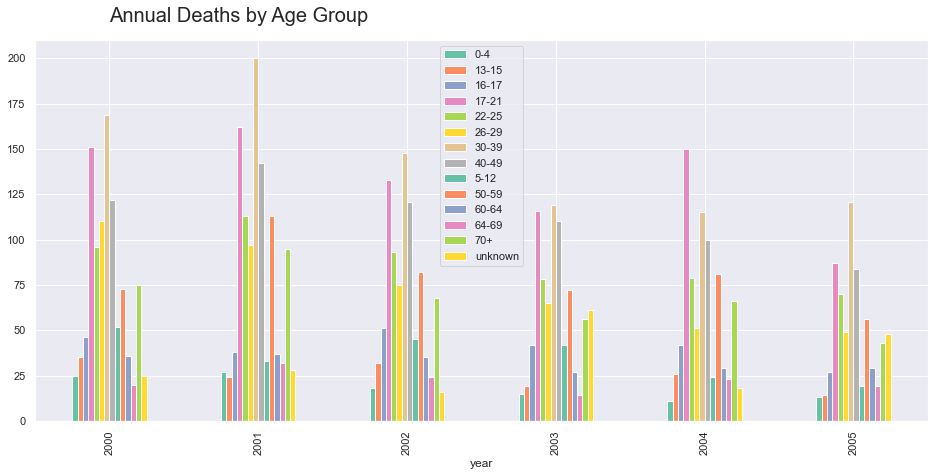

In [51]:
#Annual Deaths by Age Group

df_annual_deaths_by_age_group = group_categories_annual(df_annual_deaths_by_age_group, 'age_group')
df_annual_deaths_by_age_group.plot(kind = 'bar')
plt.text(0, 220, 'Annual Deaths by Age Group', fontsize = 20)
plt.show()

- _People in age group 30-39 are involved in a high number of fatal accidents follewed by age group 17-21_

__Counts of fatal crashes by crash type__

In [52]:
annual_deaths_by_acident_type = '''
                SELECT 
                    accident_type_desc, 
                    no_persons_killed,
                    strftime('%Y', accidentdate) as year
                FROM 
                    ACCIDENT 
                WHERE 
                    no_persons_killed > 0
                '''
df_annual_deaths_by_acident_type = pd.read_sql(annual_deaths_by_acident_type, conn)

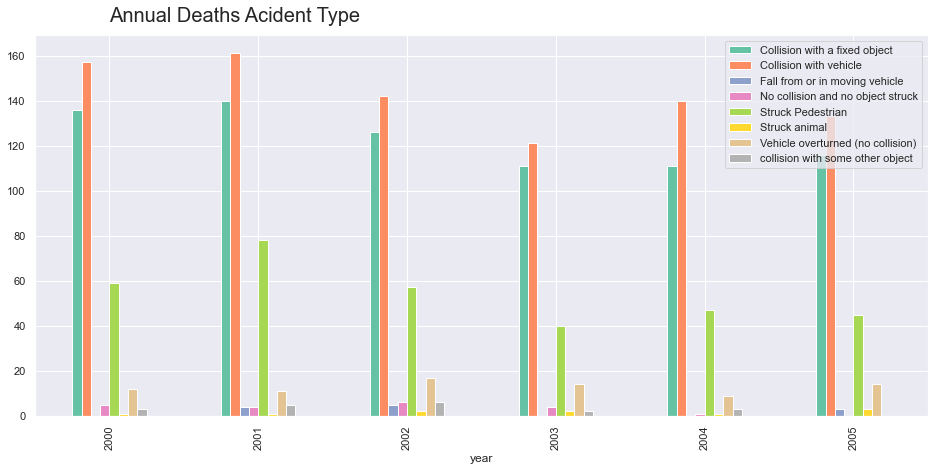

In [53]:
# Annual Deaths based on the Acident Types

df_annual_deaths_by_acident_type = group_categories_annual(df_annual_deaths_by_acident_type, 'accident_type_desc')
df_annual_deaths_by_acident_type.plot(kind = 'bar')
plt.text(0, 175, 'Annual Deaths Acident Type', fontsize = 20)
plt.show()

_Even though the overall crash volume reduced significantly, still most of the fatal accidents are seem after collision with vehicle and collision with a fixed object._

### Conclusion

In genral we observe from the data that:

- _Accidents and fatalities are trending downwards_
- _People in age group 30-39 are involved in a high number of fatal accidents follewed by age group 17-21_
- _Motor Cycles and Station Wagon have the second highes number of fatal accidents after cars._
- _The highest number of accident are happened on Fridays and the highest frequency is around time 16:00 and 15:30 with %2.6 - %2 followed by 16:30 -18:00 with %1.8 and %1.6_
- _Annual number of hospitalised people trending downwards_

Also,

We see the accidents in the intersections like,
- Two right turning
- Left Far
have some of the highest apperance in the data.

Furthermore, most of the accidents with collision happends in the intersections.

- compared to the Y-intersection roads, T-intersection roads are more likely to have accidents.

__It can decrease the collisions if the T-intersections are converted to the Y-intersection.__

